
<h1 align=center><font size = 10>Analysis of neighborhoods in Barcelona to open an ecological supermarket</font></h1>

<h3 align=center>Autor: Guillermo Fantoni</h3> 

![Barcelona](Eixample_aire.png)

<br></br>

**Introduction**     
This study is part of the final project of the IBM data science course. The only purposes of this study is to demonstrate the skills acquired during the course.
The main requirement is to use Foursquare to obtain the locations of interest, this is a problem because using the free version does not obtain all the locations and the result loses precision. It should be taken into account for the data analyzed.

The objetive of this study is analyze the Neighbourhood data to determine **What are the best neighborhoods to open a Ecological supermarket** Also developed notebook allows the analysis to be carried out in a flexible way for other businesses and selection parameters.


**Description of the problem and a discussion of the background**

Barcelona is the second city in Spain with 1.6 million people. It is one of the cities with the most trade and tourism in Europe. Its situation with a maritime port in the Mediterranean and communication with Europe makes it interesting on several levels. Given its population and level of commerce, it is an ideal place to open new businesses, the question is, what is the best neighborhood to open a business?      
 
_In this study we put ourselves in the shoes of a consultant who is asked for a study in which to select a list of neighborhoods to set up an ecological supermarket._     

The study can be carried out for any type of business and the socioeconomic parameters of interest. It is not an accurate study but it does provide an idea of which sites are ideal to start a more in-depth study. Anyone interested in starting a business can benefit from this study, and even use the notebook in a simple way to obtain personalized results.


**The data Necessary for this study are:**  
-    1.-Barcelona Neighbourhoods data, such as the names and localization.( Webscrapting, geopy API)
-    2.-Barcelona Demographic data - Population by Neighbourhoods (Statistical Institute of Catalonia)
-    3.-Barcelona Unemployment data (Statistical Institute of Catalonia)
-    4.-Barcelona Economic data (Statistical Institute of Catalonia)
-    5.-Barcelona Bussiness data (Foursquare API)
 

With these data it will be possible to analyze which neighborhoods are the most suitable to open a business. For this, indicators of age, unemployment, economic and clustering techniques will be applied to find neighborhoods with similar parameters where there are green businesses implanted.

In this case, we are interested in neighborhoods with a young population since they are the ones with the greatest ecological awareness, high incomes and the absence of similar businesses that cannot compete. 

The data is extracted through various techniques, such as Webscrapting, REST API calling and official statistical reports.      

For webscrapting and Foursaquare the data is cleaned in the extraction process. For the data obtained from official sites, they are processed with excel to match the key fields and present the appropriate format. With Geocoder, a visual inspection of the locations is carried out using Folium and representing the coordinates obtained on the map, with the support of a colormap and a GEOJSON file, the task is carried out more easily.

**how the data will be used to solve the problem of find the best neighbourhood?**     
The data collects various points of interest such as population, age ranges, economic indicators, and businesses. In the first place, the neighborhoods can be grouped by clusters and see which neighborhoods have similar qualities to those that have green businesses but have not yet opened this type of business. The factors can be used to see which neighborhood interests us the most, a high population with high incomes, a young population and the absence of similar businesses, giving more weight to a value or others, we can have which neighborhoods have a higher score depending on the parameters that we interest.    

In other words, cluster analysis and weighted factors will be applied.


(Pandas,Webscrapting, Excel, Wordcloud, Folium, GEOJSON, HTML,JSON,Foursquare, Geocoder, Unsupervised Learning, Clustering K-means, data visualization)

In [1]:
#ALL modules imported 
# the necessary modules are imported
!pip install bs4
from bs4 import BeautifulSoup # this module helps in web scrapping.
import requests  # this module helps us to download a web page
import pandas as pd  #pandas allows us to easily work with dataframes
import matplotlib.pyplot as plt 
import numpy as np 
!conda install -c conda-forge geopy --yes  
from geopy.geocoders import Nominatim   # to obtian the coordinates with the neighbourhood names. 
import folium     # Folium to interactive maps. 
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import json # library to handle JSON files
!conda install -c conda-forge wordcloud==1.4.1 --yes
from wordcloud import WordCloud, STOPWORDS  # create wordclouds
import plotly.express as px


     |████████████████████████████████| 122kB 970kB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/a0/b0/b2/4f80b9456b87abedbc0bf2d52235414c3467d8889be38dd472
Successfully built bs4
Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.12.5  |       ha878542_0         137 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-2.1.0                |     pyhd3deb0d_0          64 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         235 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda

<h1 align=center><font size = 7>Data collection, understanding and preparation</font></h1>

<h1>1.- Barcelona Neighbourhood data</h1>

In the first place we obtain the data of the districts and neighborhoods.These data are the capstone on which the rest of the study will be built.A good construction of this dataframe it will allow to work easily with the rest of the data. 

The data that interest us is on the page https://es.wikipedia.org/wiki/Distritos_de_Barcelona, We perform webscrapting to extract the necessary data.

It is vitally important that all the data obtained in this study can be joined by the name of the neighborhood. Therefore, the names of the neighborhoods obtained at this point will be used for all the other data obtained.

In this section obtain data of Barcelona Borough and neighbourhood. All the data its treated with pandas to facilitate data manipulation.
<a href="https://pandas.pydata.org/docs/">pandas documentation</a>  

-   **1.1-Borough_data:**
Obtain from wikipedia page performing webscrapting

-   **1.2.-Neighbourhood_data:**
Obtain from wikipedia page performing webscrapting

-   **1.3.-Coordinates:**
Obtain from REST API geocoder, introducing the name of the neigbourhood it's obtained the coordinates. A visual inspection with folium it's realized to modify incorrect locations.
 
<h1 align=center><font size = 5>Barcelona neighbourhoods</font></h1>   

 ![Barcelona Neighbourhood](bcn_neig.png)




In [2]:
# the necessary modules are imported
#!pip install bs4
from bs4 import BeautifulSoup # this module helps in web scrapping.
import requests  # this module helps us to download a web page
import pandas as pd  #pandas allows us to easily work with dataframes
import matplotlib.pyplot as plt 
import numpy as np 
from PIL import Image 

In [3]:
# Obtain the information from wikipedia
url = "https://es.wikipedia.org/wiki/Distritos_de_Barcelona"
r=requests.get(url)
print(r.status_code) # returns 200 when connection is successful

200


In [4]:
# Obtain the type of data to work with JSON or HTML 
r.headers['Content-Type']

'text/html; charset=UTF-8'

In [5]:
# work with HTML process the data with BeautifulSoup.
data  = requests.get(url).text
soup = BeautifulSoup(data,"html5lib")

In [6]:
# find the table that contain the data of neighbourhoods. 
tables = soup.find_all("table")
for index,table in enumerate(tables):
    if ("Barrios (nº)" in str(table)):
        table_index = index  # return the index of desired table
print(table_index)

0


<h2> 1.1 - Barcelona Borough data</h2>

The data of the bourghs it's important because visualize some graphs by neighbourhood can't be clear. A bar chart with 10 elements its more clear than a chart bar with 73 elements, the same for some others graphs. In other words 10 Boroughs are easily to visualize than 73 Neighbourhoods.
Also this information very useful given Barcelona is separated by Borough that can be interpreted as clusters

The data of the Boroughs is obtained by performing webscrapting on the <a href="https://es.wikipedia.org/wiki/Distritos_de_Barcelona">Wikipedia page about the Barcelona Boroughs</a>      
<br></br>
The data obtained have the follow Columns:
- **Borough:** Borough name 
- **Surface Km$^2$:** Surface of the Borough in square kilometers
- **Population:** Total population of the Borough
- **Density hab/Km$^2$:** Population density, indicates the number of people per square kilometer


Process the data in the response to create a dataframe with the necessary information. 

In [7]:
#create a dataframe for the borough data
bcn_borough = pd.DataFrame(columns=["Borough", "Surface Km$^2$", "Population", "Density hab/Km$^2$"])

for row in tables[table_index].tbody.find_all("tr"): #loop all the tr labels that in html are the rows of table
    col = row.find_all("td")  # and the td segments are the columns. 
    if (col != []):  # obtain the data from the wikipedia table and save in our dataframe. 
        dis = col[1].text.strip()
        sup = col[3].text.strip().replace(",",".")
        pob = col[4].text.strip().replace(" ", "")
        den = col[5].text.strip().replace(",",".").replace(" ", "")
        bcn_borough = bcn_borough.append({"Borough":dis, "Surface Km$^2$": sup, "Population":pob, "Density hab/Km$^2$":den}, ignore_index=True)

bcn_borough.head(10) # show the obtained data

,Borough,Surface Km$^2$,Population,Density hab/Km$^2$
0,Ciutat Vella,4.11,103 429,25 159.09
1,Eixample,7.46,265 910,35 625.67
2,Sants-Montjuïc,22.68,184 091,8118.32
3,Les Corts,6.02,81 974,13 607.11
4,Sarrià-Sant Gervasi,19.91,149 260,7497.11
5,Gràcia,4.19,121 798,29 082.62
6,Horta - Guinardó,11.96,171 495,14 342.64
7,Nou Barris,8.05,170 669,21 198.48
8,Sant Andreu,6.59,149 821,22 724.25
9,Sant Martí,10.39,238 315,22 943.58


In [8]:
#Once the desired data is obtained and verified, we export it to .csv file
bcn_borough.to_csv("bcn_borugh.csv", index = False) 

The data is procesed with excel to clean it 

In [9]:
bcn_borough = pd.read_csv("bcn_borough2.csv") #import the clean data
bcn_borough.head(10) # show the clean data 

,Borough,Surface Km$^2$,Population,Density hab/Km$^2$
0,Ciutat Vella,4.11,103429,25159.09
1,Eixample,7.46,265910,35625.67
2,Sants-Montjuïc,22.68,184091,8118.32
3,Les Corts,6.02,81974,13607.11
4,Sarrià-Sant Gervasi,19.91,149260,7497.11
5,Gràcia,4.19,121798,29082.62
6,Horta - Guinardó,11.96,171495,14342.64
7,Nou Barris,8.05,170669,21198.48
8,Sant Andreu,6.59,149821,22724.25
9,Sant Martí,10.39,238315,22943.58


<h2>1.2 - Barcelona Neighbourhood data</h2>

The neighborhood data has to be joined in this data frame to allow the rest of the data to be analyzed flexibly. It may be interesting at some point to see the data for Boroughs. But essentially and with great care, all the data obtained must have the same names in the neighborhood column to be able to relate the tables to each other.

In the same way as the previous point, the data for the neighborhoods are obtained by webscrapting.

The data obtained have the follow Columns:
- **NºBorough:** Borough number
- **Borough:** Borough name
- **NºNeighbourhood** Neighbourhood number 
- **Neighbourhood:** Neighbourhood name


In [10]:
# As the same way for the borough obtain the data of the niehgbourhoods. 

bcn_neighbourhoods = pd.DataFrame(columns=["NºBorough", "Borough", "NºNeighbourhood" ,"Neighbourhood"])

count = 0
for row in tables[table_index].tbody.find_all("tr"): # loop all the rows
    col = row.find_all("td")  # find all the columns. 
    if (col != []):
        for barrios in col[6]: # The column of the neighbourhood have in a list [Name,(Nº),Name,Nº]. odd and even are treated separately 
            if count%2 == 0:
                barrio = barrios.text   # keep the neighbourhood name
            else:
                a = barrios.split("(")  # obtain Nº)
                b = a[1].split(")")     # obtain Nº
                nbar = b[0]             # keep the neighbourhood number
                dis = col[1].text.strip()  # keep the borough
                ndis = col[0].text.strip()  # keep the borough number
                bcn_neighbourhoods = bcn_neighbourhoods.append({"NºBorough":ndis, "Borough":dis,"NºNeighbourhood":nbar,"Neighbourhood": barrio}, ignore_index=True)
                
            count = count + 1     
                

bcn_neighbourhoods.head(10) #show the data 

,NºBorough,Borough,NºNeighbourhood,Neighbourhood
0,1,Ciutat Vella,1,El Raval
1,1,Ciutat Vella,2,Barrio Gótico
2,1,Ciutat Vella,3,La Barceloneta
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera"
4,2,Eixample,5,El Fort Pienc
5,2,Eixample,6,Sagrada Familia
6,2,Eixample,7,La Derecha del Ensanche
7,2,Eixample,8,L'Antiga Esquerra de l'Eixample
8,2,Eixample,9,La Nova Esquerra de l'Eixample
9,2,Eixample,10,Sant Antoni


In [11]:
#show the quantity of neighbourhoods. 
bcn_neighbourhoods.shape

(75, 4)

In [12]:
#Obtain the invalid neighbourhoods
bcn_neighbourhoods[bcn_neighbourhoods["NºNeighbourhood"]=="*"]

,NºBorough,Borough,NºNeighbourhood,Neighbourhood
18,3,Sants-Montjuïc,*,Zona Franca
19,3,Sants-Montjuïc,*,Montjuïc


In [13]:
#Remove the invalid neighboudhoods. 
bcn_neighbourhoods.drop([18,19], inplace = True)
bcn_neighbourhoods.reset_index  # Reset the index of the dataframe
bcn_neighbourhoods.shape

(73, 4)

In [16]:
#Show the types of dataframe 
bcn_neighbourhoods.dtypes

NºBorough          object
Borough            object
NºNeighbourhood    object
Neighbourhood      object
dtype: object

In [17]:
# modify the incorrect data types. 
bcn_neighbourhoods["NºBorough"].astype("int64",copy=False)
bcn_neighbourhoods["NºNeighbourhood"].astype("int64",copy=False)

0      1
1      2
2      3
3      4
4      5
      ..
70    69
71    70
72    71
73    72
74    73
Name: NºNeighbourhood, Length: 73, dtype: int64

In [18]:
#Once the desired data is obtained and verified, we export it to .csv
bcn_neighbourhoods.to_csv("bcn_neighbourhoods.csv", index = False)

In [19]:
#Count the number of neighbourhoods in each borough. 
bcn_neighbourhoods['Borough'].value_counts()

Nou Barris             13
Horta - Guinardó       11
Sant Martí             10
Sants-Montjuïc          8
Sant Andreu             7
Eixample                6
Sarrià-Sant Gervasi     6
Gràcia                  5
Ciutat Vella            4
Les Corts               3
Name: Borough, dtype: int64

<h2>1.3-Barcelona Neighbourhood coordinates data</h2>

The coordinates for each neighborhood are essential to view the information on a map and obtain nearby business locations. Also for a city visualizing the data with a colored map and introducing information with interactive markers is very useful and clean.

With geopy.geocoders Nominatim is obtained the coordinates from each neighbourhood. This API isn't totally accurate so a visual inspection is necessary that we will carry out with Folium.


<a href="https://geopy.readthedocs.io/en/stable/">geopy documentation</a>    
<a href="https://python-visualization.github.io/folium/">Folium documentation</a>    


The data obtained have the follow Columns:
- **NºBorough:** Borough number
- **Borough:** Borough name
- **NºNeighbourhood** Neighbourhood number 
- **Neighbourhood:** Neighbourhood name
- **latitude:**  Latitude of the neighbourhood
- **longitude:** Longitude of the neihbourhood

In [20]:
#the data obtained in the previus point it's recovered
bcn_neighbourhoods = pd.read_csv("bcn_neighbourhoods.csv")

In [21]:
#!conda install -c conda-forge geopy --yes  
from geopy.geocoders import Nominatim   # to obtian the coordinates with the neighbourhood names. 
import pandas as pd
import numpy as np
import folium     # Folium to interactive maps. 

The coordinates for each neighborhood are obtained with Nominatim

In [22]:
bcn_coor = pd.DataFrame(columns = ['neighbourhood','latitude', 'longitude'])

geolocator = Nominatim(user_agent="barcelona")
location1 =  geolocator.geocode('{}, '.format('Parkwoods')) # obtain no null value for the comparation in the IF 
count = 0
for neig in bcn_neighbourhoods['Neighbourhood']:
    location = geolocator.geocode('{}, Barcelona'.format(neig))
    if type(location1) == type(location):  #If coordinates are finding append the data to dataframe. 
        latitude = location.latitude
        longitude = location.longitude
        bcn_coor = bcn_coor.append({"neighbourhood": neig , "latitude":latitude, "longitude":longitude}, ignore_index=True)
    else:  # If  coordinates aren't finding return a NaN value to identify easily. 
        bcn_coor = bcn_coor.append({"neighbourhood": neig , "latitude":np.nan, "longitude":np.nan}, ignore_index=True)

In [24]:
bcn_coor.head(10) # show the first 10 rows. 

,neighbourhood,latitude,longitude
0,El Raval,41.379518,2.168368
1,Barrio Gótico,41.383395,2.176912
2,La Barceloneta,41.380653,2.189927
3,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411
4,El Fort Pienc,41.395925,2.182325
5,Sagrada Familia,41.403479,2.174410
6,La Derecha del Ensanche,NaN,NaN
7,L'Antiga Esquerra de l'Eixample,41.390000,2.155000
8,La Nova Esquerra de l'Eixample,41.383389,2.149000
9,Sant Antoni,41.378412,2.161768


### ----Clean the data----
First count the Null values. 

In [23]:
#obtain the total nulls of the dataframe. 
bcn_coor["longitude"].isna().sum()

1

In [25]:
#6 La Derecha del Ensanche 41.394560, 2.167998
bcn_coor.loc[6,"latitude"] = 41.394560
bcn_coor.loc[6,"longitude"] = 2.167998

In [26]:
#Join the data of neighbourhoods with coordinates. 
bcn_neig_coord = bcn_neighbourhoods.join(bcn_coor.set_index('neighbourhood'), on='Neighbourhood', how='inner')
bcn_neig_coord.head(5)

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325


In [27]:
#Obtain basic info of the dataframe
bcn_neig_coord.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73 entries, 0 to 72
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NºBorough        73 non-null     int64  
 1   Borough          73 non-null     object 
 2   NºNeighbourhood  73 non-null     int64  
 3   Neighbourhood    73 non-null     object 
 4   latitude         73 non-null     float64
 5   longitude        73 non-null     float64
dtypes: float64(2), int64(2), object(2)
memory usage: 4.0+ KB


In [28]:
bcn_neig_coord.shape

(73, 6)

Second a visual inspection is carried out with Folium by entering the neighborhood data and a GEOJSON file

In [30]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_neig_coord,
    columns=['Neighbourhood', 'latitude'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.5,
    legend_name='Barcelona Neighbourhood',
    reset = True
)

for latitude, longitude, neighbourhood in zip(bcn_coor['latitude'], bcn_coor['longitude'], bcn_coor['neighbourhood']):
    label = 'Neihbourhood: {}'.format(neighbourhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=2,
        popup=label,
        color='blue',
        fill=True
        ).add_to(neighbour_map)  
    

# display map
neighbour_map

You can see how many of the locations are wrong. After visual inspection replace the wrong coordinates.The locations are obtained manually with google maps. 

In [31]:
pd.options.display.max_rows = 999
bcn_neig_coord.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325


In [32]:
#60 San Andrés 41.439777, 2.190852
bcn_neig_coord.loc[59,"latitude"] = 41.439777
bcn_neig_coord.loc[59,"longitude"] = 2.190852

#63Navas   41.418463, 2.185856
bcn_neig_coord.loc[62,"latitude"] = 41.418463
bcn_neig_coord.loc[62,"longitude"] = 2.185856

#49Canyelles 41.443308, 2.165594
bcn_neig_coord.loc[48,"latitude"] = 41.443308
bcn_neig_coord.loc[48,"longitude"] = 2.165594

#29El Coll  41.418670, 2.1408036
bcn_neig_coord.loc[28,"latitude"] = 41.418670 
bcn_neig_coord.loc[28,"longitude"] = 2.148036

#37El Carmelo  41.422029, 2.155973
bcn_neig_coord.loc[36,"latitude"] = 41.422020
bcn_neig_coord.loc[36,"longitude"] = 2.155973

#56 Vallbona  41.464200, 2.183723
bcn_neig_coord.loc[55,"latitude"] = 41.464200
bcn_neig_coord.loc[55,"longitude"] = 2.183723

#24 Las Tres Torres 41.398636, 2.130102
bcn_neig_coord.loc[23,"latitude"] = 41.398636
bcn_neig_coord.loc[23,"longitude"] = 2.130102

#11Poble Sec 41.369717, 2.158336
bcn_neig_coord.loc[10,"latitude"] = 41.369717
bcn_neig_coord.loc[10,"longitude"] = 2.158336

#40Montbau 41.431342, 2.140847
bcn_neig_coord.loc[39,"latitude"] = 41.431342
bcn_neig_coord.loc[39,"longitude"] = 2.140847

#41vall d'hebron 41.430803, 2.149950
bcn_neig_coord.loc[40,"latitude"] =  41.430803
bcn_neig_coord.loc[40,"longitude"] =  2.149950

#58baro de viver 41.446124, 2.198391
bcn_neig_coord.loc[57,"latitude"] = 41.446124 
bcn_neig_coord.loc[57,"longitude"] = 2.198391

#55 ciutat meridiana 41.460690, 2.174121
bcn_neig_coord.loc[54,"latitude"] = 41.460690
bcn_neig_coord.loc[54,"longitude"] = 2.174121

In [33]:
bcn_neig_coord

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325
5,2,Eixample,6,Sagrada Familia,41.403479,2.174410
6,2,Eixample,7,La Derecha del Ensanche,41.394560,2.167998
7,2,Eixample,8,L'Antiga Esquerra de l'Eixample,41.390000,2.155000
8,2,Eixample,9,La Nova Esquerra de l'Eixample,41.383389,2.149000
9,2,Eixample,10,Sant Antoni,41.378412,2.161768


Now the locations are matching and the colored map is pretty ;)

In [34]:
bcn_n_geo = r'barris.geojson' # geojson file

# Create a color map with the colors of latitude by neighbourhoods. 
neighbour_map2 = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map2.choropleth(
    geo_data=bcn_n_geo,
    data=bcn_neig_coord,
    columns=['Neighbourhood', 'latitude'],
    key_on='feature.properties.NOM',        # field to match with GEOJSON
    fill_color='YlOrRd',                    #color escale
    fill_opacity=0.7, 
    line_opacity=0.5, 
    legend_name='Barcelona Neighbourhood',
    reset = True
)

# Insert labels for each neighbourhood with the info of neighbourhood and the coordinates. 
for latitude, longitude, neighbourhood, n in zip(bcn_neig_coord['latitude'], bcn_neig_coord['longitude'], bcn_neig_coord['Neighbourhood'],bcn_neig_coord['NºNeighbourhood']):
    label = 'Neihbourhood: {} - {}- coordinates{},{}'.format(n,neighbourhood,latitude,longitude) # add the info 
    label = folium.Popup(label, parse_html=True) 
    folium.CircleMarker(              # select the type of marker. 
        [latitude, longitude],         #coordinates are indicated
        radius=2,                      #select the radius of the marker. 
        popup=label,                   #info of the neighbourhood. 
        color='blue',                  #color 
        fill=True
        ).add_to(neighbour_map2)  
    

# display map
neighbour_map2

In [36]:
# Once the data is validated, we export it
bcn_neig_coord.to_csv("bcn_data.csv", index = False) 

<h1>2.- Barcelona demographic data</h1>    

With a population of 1,6 millions it's very interesting see how this people it's distributed, both by area and by age.


In this section is obtained the population data by neighbourhoods in total and in groups of 5 years.  

This information interests us if we are focused on a specific age group, in our case we are interested in people between 15 and 40 years old who are highly environmentally conscious. People between 15 and 20 years of age do not have the capacity to consume, but the youngest have a greater awareness and in a few years they will have an income that allows them to be consumers.


The data is extracted from the Barcelona official site and cleaned with excel, the name of the neighbourhoods is replaced with the names obtained in the point 1.


- **2.1.- Neighbourhood population**    
https://www.bcn.cat/estadistica/castella/dades/tpob/pad/ine/a2019/sexe/barri.htm (2019)   
Source: institut d'Estadística de Catalunya.   

- **2.2.- Quinquennial age neighbourhood population data**
https://www.bcn.cat/estadistica/castella/dades/tpob/pad/padro/a2019/edat/edatq05.htm   
Source: Ajuntament de Barcelona. Departament d'Estadística i Difusió de Dades. Lectura del Padrón Municipal de Habitantes a 1 enero 2019.

- **GEOJSON files** :     
The GEOJSON files are obtained from the github repository https://github.com/martgnz/bcn-geodata, and change the neighbourhoods names to make them coincide with the rest of the data

In [37]:
import plotly.express as px
import numpy as np
import pandas as pd
import folium

<h2>2.1- Neighbourhood population </h2>

The population by neighborhood is a magnificent indicator to determine the level of economic activity of the businesses in an area. The greater the population, the greater the number of nearby consumers.

The data have the follow Columns:
- **NºBorough:** Borough number
- **Borough:** Borough name
- **NºNeighbourhood** Neighbourhood number 
- **Neighbourhood:** Neighbourhood name
- **Population:** Total population for each neighbourhood

In [35]:
#Import the data of population 
population = pd.read_excel("Neighbourhood_population.xlsx")

In [36]:
#show the data imported 
population.head()

,NºBorough,Borough,Nº Neighbourhood,Neighbourhood,Population
0,1,Ciutat Vella,1,El Raval,47353
1,1,Ciutat Vella,2,Barrio Gótico,18629
2,1,Ciutat Vella,3,La Barceloneta,14857
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",22590
4,2,Eixample,5,El Fort Pienc,32349


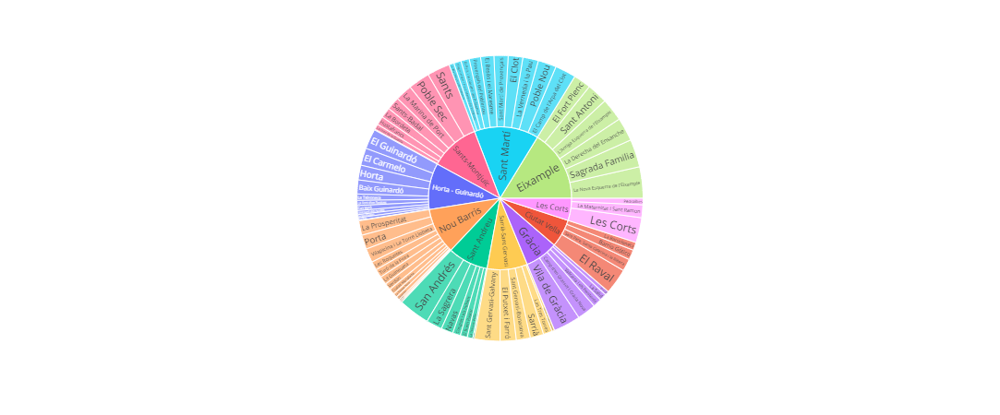

In [40]:
#Make a Sunburst chart to interactive pretty visualization of Barcelona Population
fig = px.sunburst(population, path=['Borough', 'Neighbourhood'], values='Population', color='Borough')
fig.show()

<h3>2.1.1- Neighbourhood population heatmap</h3>

A best way to visualize the data of a neighbourhoods in a city its a interactive colormap. The map it's performanced with Folium and allows us to see population levels very directly 

In [37]:
bcn_n_geo = r'barris.geojson' # geojson file

neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=population,
    columns=['Neighbourhood', 'Population'],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.4,
    legend_name='Barcelona Neighbourhood population',
    reset = True
)

for latitude, longitude, borough, neighbourhood, population in zip(bcn_neig_coord['latitude'], bcn_neig_coord['longitude'], bcn_neig_coord['Borough'], bcn_neig_coord['Neighbourhood'],population['Population']):
    label = 'Neihbourhood: {},Borough: {}, Population: {}'.format(neighbourhood, borough,population)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=2,
        popup=label,
        color='blue',
        bins = 11,
        fill=True
        ).add_to(neighbour_map)  
    

# display map
neighbour_map

<h2>2.2- Quinquennial age neighbourhood population</h2>

Each population group may have different interests, and they may occupy different market segments. If we wanted to open a nursery, we would look for a very young population, and if we wanted to open a hearing aid store, we would be interested in the elderly population. For this it's interest analyze the population by group ages. 

The dataset have information of the population of group ages for each neighbour. Each column groups the population by age into 5-year groups.

The data have the follow Columns:
- **NºBorough:** Borough number
- **Borough:** Borough name
- **NºNeighbourhood** Neighbourhood number 
- **Neighbourhood:** Neighbourhood name 
- **Total:** Total population for each neighbourhood. 
- **[0-4,90-94]** Population for each neighbourhood in age gruops of 5 years 

In [42]:
#Import the data of population separated in age groups. 
quin_population = pd.read_excel("Neighbourhood_population_by_years_2019.xlsx")
quin_population.head(3)

,NºBorough,Borough,Nº Neighbourhood,Neighbourhood,TOTAL,0-4,05-09,10-14,15-19,20-24,...,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95 años
0,0,Barcelona,0,Barcelona,1636762,66441,68578,69735,69023,81566,...,113775,104388,93339,83739,81079,62034,54766,42523,19944,5980
1,1,Ciutat Vella,1,El Raval,47353,2068,2086,1839,1960,3031,...,2969,2400,1870,1444,1198,898,850,627,338,78
2,1,Ciutat Vella,2,Barrio Gótico,18629,506,477,442,496,1380,...,1139,959,777,578,474,346,313,256,137,52


In [43]:
columns = quin_population.columns.tolist()
age_groups = pd.DataFrame(columns = ['Neighbourhood','TOTAL', '0-14','15-29','30-44','45-59','60-74','75-89','>=90'])

age_groups["Neighbourhood"] = quin_population["Neighbourhood"]
age_groups["TOTAL"] = quin_population["TOTAL"]
age_groups["0-14"] = quin_population["0-4"] + quin_population["05-09"] + quin_population["10-14"]
age_groups["15-29"] = quin_population["15-19"] + quin_population["20-24"] + quin_population["25-29"]
age_groups["30-44"] = quin_population["30-34"] + quin_population["35-39"] + quin_population["40-44"]
age_groups["45-59"] = quin_population["45-49"] + quin_population["50-54"] + quin_population["55-59"]
age_groups["60-74"] = quin_population["60-64"] + quin_population["65-69"] + quin_population["70-74"]
age_groups["75-89"] = quin_population["75-79"] + quin_population["80-84"] + quin_population["85-89"]
age_groups[">=90"] = quin_population["90-94"] + quin_population["95 años"]
age_groups.head(10)

    

,Neighbourhood,TOTAL,0-14,15-29,30-44,45-59,60-74,75-89,>=90
0,Barcelona,1636762,204754,264217,384466,339921,258157,159323,25924
1,El Raval,47353,5993,10382,14562,9113,4512,2375,416
2,Barrio Gótico,18629,1425,4742,6147,3382,1829,915,189
3,La Barceloneta,14857,1146,3140,4503,2774,1788,1310,196
4,"Sant Pere, Santa Caterina i la Ribera",22590,2116,4997,7143,4224,2406,1458,246
5,El Fort Pienc,32349,3706,5455,8028,6338,5223,3049,550
6,Sagrada Familia,51385,5292,8423,12545,10390,8567,5132,1036
7,La Derecha del Ensanche,43515,5086,7424,10215,8835,6891,4077,987
8,L'Antiga Esquerra de l'Eixample,42393,4558,7532,10458,8421,6496,4021,907
9,La Nova Esquerra de l'Eixample,58032,6108,9606,13909,11168,10275,5917,1049


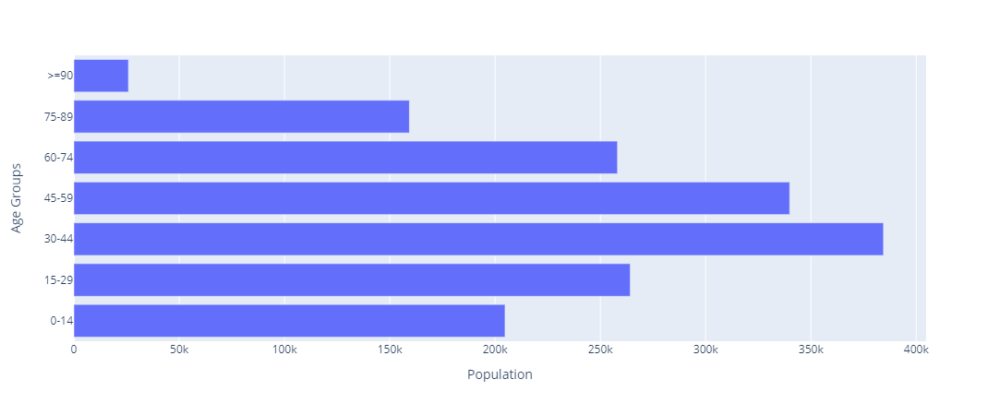

In [44]:
#Show the age groups with a barchart. 
age_groups2 = age_groups[age_groups.columns.tolist()[2:]].head(1)
age_groups2 = age_groups2.transpose()
age_groups2.rename(columns={0:'Population'}, inplace = True)
age_groups2.index.names = ["Age Groups"]
fig = px.bar(age_groups2, x="Population", orientation='h')
fig.show()

The predominant group is 30 to 44 years old. Demographically an uncertain future can be seen. The active population between the ages of 15 and 60 is the majority and maintains the social services and benefits of the rest of the population. When this population ages and retires, given that the Young population is not enough, the retirement paynments of the elderly will not be able to be maintained. This phenomenon explains the insistence of some politicians on private retirement plans.

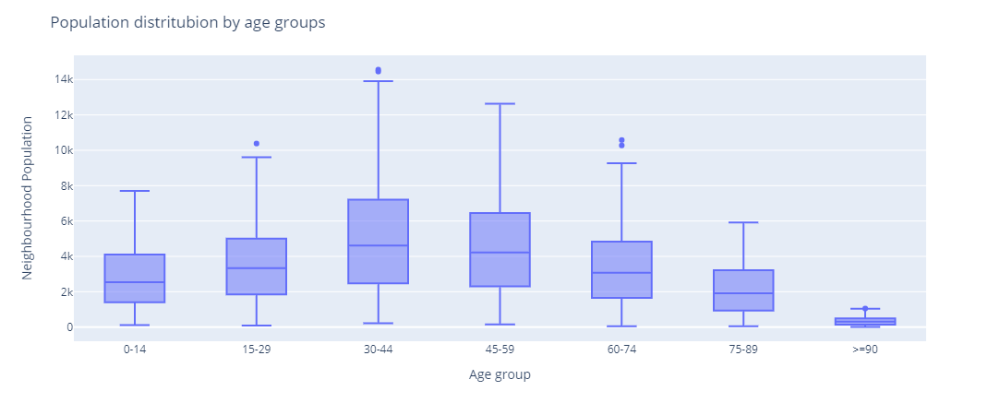

In [45]:
#Make a Box plot to visualize the distribution of ages in the neighbourhoods. 
age_groups.drop(0,inplace = True)  # drop the row of totals. 
age_groups.columns.tolist()[2:]
fig = px.box(age_groups, y=age_groups.columns.tolist()[2:])
fig.update_layout(
    title="Population distritubion by age groups",
    xaxis_title="Age group",
    yaxis_title="Neighbourhood Population")
fig.show()

It is appreciated that there is almost no elderly population in the neighborhoods. The largest groups are those between 30 and 60 years old.

<h1>3.- Barcelona unemployement data</h1>



Knowledge of unemployment data and its evolution is important to have an image of the development of the neighborhood. In this point it's treated the unemployement data as people without work and the percentage for unemployment for each neighbourhood. 

The data is extracted from the Barcelona official website and cleaned with excel, the name of the neighbourhoods is replaced with the names obtained in the point 1.

- **3.1.- Barcelona neighbourhood unemployement population**  
https://www.bcn.cat/estadistica/castella/dades/barris/ttreball/atur/Evolucio/bcnbar.htm (2020-2021)    
Source: Departament de Treball, Afers Socials i Famílies. Generalitat de Catalunya.  
Elaboración del Departament d'Estadística. Ajuntament de Barcelona.  

-  **3.2.- Barcelona neighbourhood unemployement percentage**  
Obtain procesing the 3.1 dataset


The data is visualized with Plotly that make pretty and easy graphs. <a href="https://plotly.com/python/">plotly documentation</a>  

In [46]:
import pandas as pd   # work with dataframes
import numpy as np 
import plotly.express as px  # Pretty Visualization
import folium

<h2>3.1- Barcelona neighbourhood unemployement population</h2>

Knowing the unemployment data is another indicator of the population that can be interesting, it can determine the concerns of an area or determine consumption trends.


The used dataset have the information of the unemployment population for each neighbourhood by month since january 2020. 

Columns:   
- **NºBorough:** Number of the district   
- **Borough:** Disctrit that content the neighbourhood   
- **Nº Neighbourhood:** Number of neighbourhood   
- **Neighbourhood:** Neighbourhood name
- **Población 16-64 años:** Active population (Can Work)   
- **[2020-1;2021-3]:** one column for each month since January 2020 to March 2021, represents the total population in unemployement situation.


In [47]:
neig_unem_pop = pd.read_excel("Neighbourhood_unemployment_population_2020_2021.xlsx") #import the unemployment data 
neig_unem_pop.head() # show the data 

,Nº Borough,Borough,Nº Neighbourhood,Neighbourhood,Población 16-64 años,2020-1,2020-2,2020-3,2020-4,2020-5,2020-6,2020-7,2020-8,2020-9,2020-10,2020-11,2020-12,2021-1,2021-2,2021-3
0,0,Barcelona,0,Barcelona,1095455,70109.120,71204.575,76681.850,86540.945,90922.765,93113.675,90922.765,93113.675,90922.765,92018.220,92018.220,94209.130,96400.040,97495.495,96400.040
1,1,Ciutat Vella,1,El Raval,36330,3051.720,3124.380,3378.690,4068.960,4250.610,4468.590,4432.260,4577.580,4613.910,4831.890,4904.550,5049.870,5195.190,5304.180,5267.850
2,1,Ciutat Vella,2,Barrio Gótico,17931,914.481,950.343,1022.067,1165.515,1255.170,1273.101,1255.170,1291.032,1273.101,1344.825,1362.756,1398.618,1434.480,1452.411,1416.549
3,1,Ciutat Vella,3,La Barceloneta,11346,998.448,1009.794,1089.216,1214.022,1304.790,1338.828,1304.790,1350.174,1327.482,1361.520,1361.520,1395.558,1440.942,1463.634,1463.634
4,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",17817,1371.909,1389.726,1514.445,1674.798,1799.517,1852.968,1799.517,1852.968,1835.151,1870.785,1888.602,1924.236,1995.504,2013.321,2013.321


<h2>3.2- Barcelona neighbourhood unemployement percentage</h2>

The unemployment data measured in people can be misleading, so for this study we will work with the unemployment percentages for each neighborhood.

The dataset shows the unemployment rate for each neighborhood. This percentage is obtained from the population of each neighborhood with respect to the population between 16 and 60 years for that same neighborhood.

- **NºBorough:** Number of the district   
- **Borough:** Disctrit that content the neighbourhood   
- **Nº Neighbourhood:** Number of neighbourhood   
- **Neighbourhood:** Neighbourhood name
- **Población 16-64 años:** Active population (Can Work)   
- **[2020-1;2021-3]:** one column for each month since January 2020 to March 2021, represents the percentage of population in unemployement respect a total neighbourhood population. 


In [48]:
neig_unem_perc = pd.read_excel("Neighbourhood_unemployment_percentage_2020_2021.xlsx") #import the data 
neig_unem_perc.head()  # show the data 

,Nº Borough,Borough,Nº Neighbourhood,Neighbourhood,Población 16-64 años,2020-1,2020-2,2020-3,2020-4,2020-5,2020-6,2020-7,2020-8,2020-9,2020-10,2020-11,2020-12,2021-1,2021-2,2021-3
0,0,Barcelona,0,Barcelona,1095455,6.4,6.5,7.0,7.9,8.3,8.5,8.3,8.5,8.3,8.4,8.4,8.6,8.8,8.9,8.8
1,1,Ciutat Vella,1,El Raval,36330,8.4,8.6,9.3,11.2,11.7,12.3,12.2,12.6,12.7,13.3,13.5,13.9,14.3,14.6,14.5
2,1,Ciutat Vella,2,Barrio Gótico,17931,5.1,5.3,5.7,6.5,7.0,7.1,7.0,7.2,7.1,7.5,7.6,7.8,8.0,8.1,7.9
3,1,Ciutat Vella,3,La Barceloneta,11346,8.8,8.9,9.6,10.7,11.5,11.8,11.5,11.9,11.7,12.0,12.0,12.3,12.7,12.9,12.9
4,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",17817,7.7,7.8,8.5,9.4,10.1,10.4,10.1,10.4,10.3,10.5,10.6,10.8,11.2,11.3,11.3


In [49]:
neig_unem_perc2 = neig_unem_perc.drop(0) #Keep the row of all Barcelona

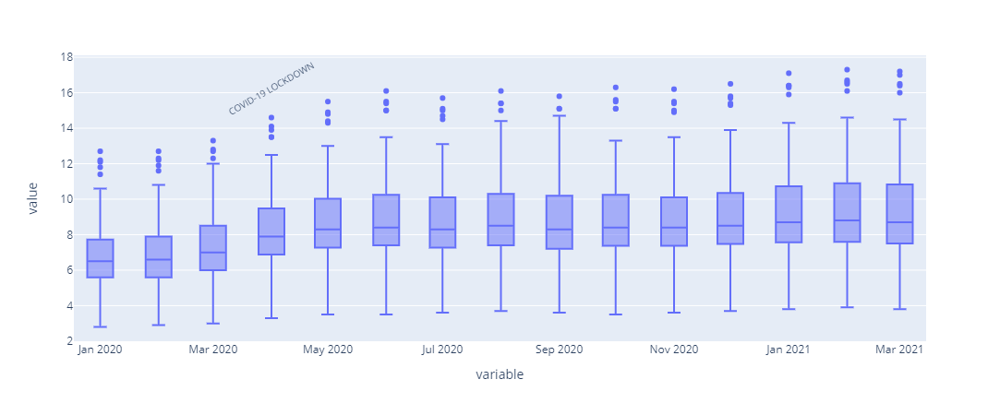

In [50]:
#Visualize the box plots for each month. 
fig = px.box(neig_unem_perc2, y=neig_unem_perc2.columns.tolist()[5:])
#Add a text for make a annotation
fig.add_annotation(x="2020-4", y=16,   
            text="COVID-19 LOCKDOWN",   #text
            showarrow=False,
            textangle = 330,    #angle of rotation
            font_size =10,     #text font
            yshift=5)
fig.show()

There is an evolution of the unemployment rate, mainly this trend begins with the global pandemic situation. You can see some neighborhoods that have extreme unemployment rates above 15%. In general, the average unemployment rate is 9%.

In [51]:
#Show the neighbourhoods with the lowest unemployment
neig_unem_perc.sort_values("2021-3").head(5)

,Nº Borough,Borough,Nº Neighbourhood,Neighbourhood,Población 16-64 años,2020-1,2020-2,2020-3,2020-4,2020-5,2020-6,2020-7,2020-8,2020-9,2020-10,2020-11,2020-12,2021-1,2021-2,2021-3
21,4,Les Corts,21,Pedralbes,7002,2.8,2.9,3.0,3.3,3.5,3.5,3.6,3.7,3.6,3.5,3.6,3.7,3.8,3.9,3.8
23,5,Sarrià-Sant Gervasi,23,Sarrià,15067,2.9,3.0,3.1,3.5,3.7,3.7,3.8,3.8,3.8,3.7,3.8,3.9,4.0,4.1,4.0
22,5,Sarrià-Sant Gervasi,22,"Vallvidrera, el Tibidabo i les Planes",3095,2.9,3.0,3.2,3.6,3.7,3.8,3.8,3.9,3.9,3.8,3.9,3.9,4.1,4.1,4.0
42,7,Horta - Guinardó,42,La Clota,497,3.2,3.4,3.4,4.0,4.2,4.2,4.2,4.2,4.2,4.2,4.4,4.4,4.6,4.6,4.5
26,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,29947,3.5,3.5,3.6,4.2,4.4,4.5,4.5,4.5,4.5,4.5,4.6,4.7,4.7,4.8,4.7


The Neighbourhoods into **Les Corts and Sarrià-Sant Gervasi have the lowest unemployement**, with rates arund the 4.5 points. 

<h1>4.- Barcelona Economic data</h1>

This section deals with the information on expenditure and income level of the population of Barcelona. This information tells us which spending groups are the majority and in which it is a good idea to invest. And which neighborhoods have the greatest economic capacity.

The data is extracted from the Barcelona official website and cleaned with excel, the name of the neighbourhoods is replaced with the names obtained in the point 1.

- **4.1.- Expenditure groups for Barcelona population 2016**  
https://www.idescat.cat/indicadors/?id=anuals&n=10425&lang=es   
Surce: Idescat. Estadística de gasto en consumo de los hogares, base 2016.


- **4.2.- RFD indicator for each neighbourhood in Barcelona 2007-2017**    
https://www.bcn.cat/estadistica/catala/dades/economia/renda/rdfamiliar/evo/rfbarris.htm  
Source: Ajuntament de Barcelona. Oficina Municipal de Dades.


Import the necessary modules

In [52]:
import plotly.express as px # Plotly for visualization
import pandas as pd #Easy work with dataframes
import folium

## 4.1 Expenditure groups for Barcelona population

This dataset shows the expenditure made per person in different areas of consumption.    

This information indicates the spending groups of the population of Barcelona and which could be a business opportunity.


Columns of the dataset:
- **Expediture Groups:** Different groups in which the expenditure is made.   
- **per person(Eur):** Anual expenditure made for each expenditure group in Euros.   

In [53]:
consumo = pd.read_csv("expenditure.csv") # import the data of expenditure groups

In [54]:
consumo_groups = consumo  
consumo_groups.drop(0, axis = 0, inplace = True)  # drop the row of total value. 
consumo_groups.drop("per household(Eur)", axis = 1, inplace = True)  # drop the column of consume by household
consumo_groups.sort_values(by='per person(Eur)', inplace = True, ascending=False)  # sort the values
consumo_groups.head() #show the data 

,expenditure groups,per person(Eur)
4,living place,4428
1,Food and non-alcoholic beverages,1865
7,Transport,1672
11,Restaurants and hotels,1151
12,Other goods and services,1064


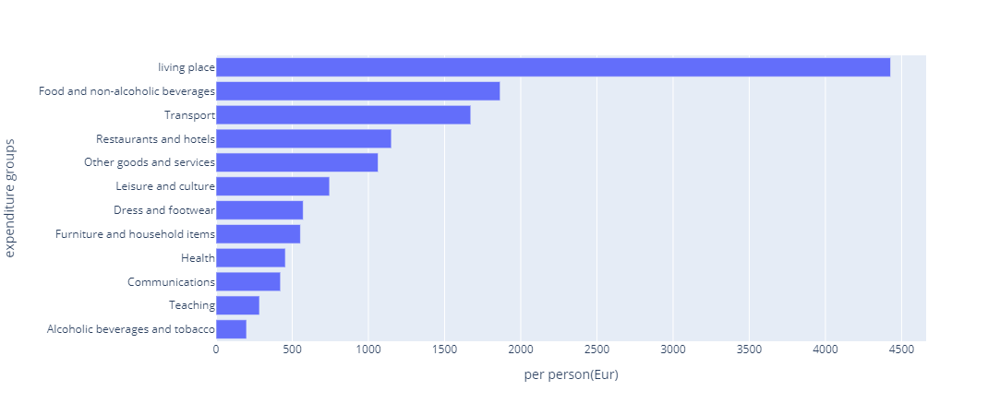

In [55]:
# create a graph of bars with plotly to clear visualization of the data 
consumo_groups.sort_values(by='per person(Eur)', inplace = True, ascending=True)
fig = px.bar(consumo_groups, x="per person(Eur)", y="expenditure groups ", orientation='h')
fig.show()

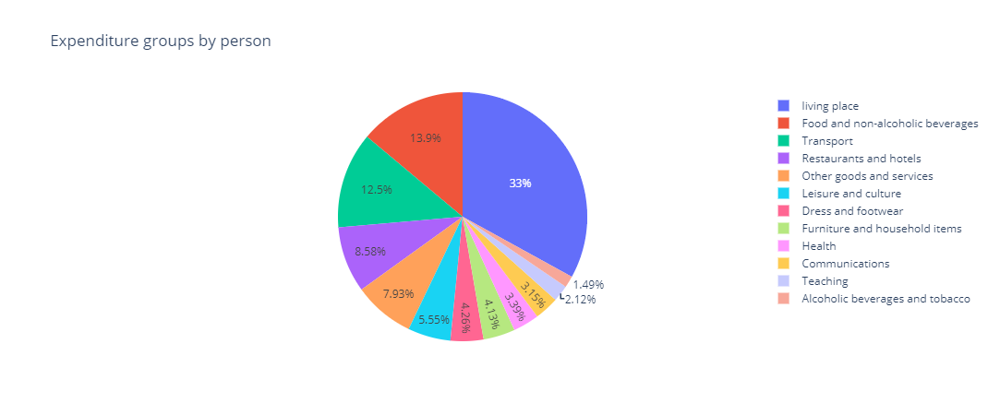

In [56]:
#create a pie chart to complement the visualization 
fig = px.pie(consumo_groups, values='per person(Eur)', names='expenditure groups ', title='Expenditure groups by person')
fig.show()

Given that 33% of spending is on housing.
The second group of expenditure is determined to be on food with the 13.9% of the expenditure, this gruop its a interesting sector to analyze to open a bussines. 

## 4.2 RFD indicator for each neighbourhood in Barcelona

The RFD indicator (Renta Familiar Disponible per cápita/ Per capita Available Family Income) is the amount of income available to resident families for consumption and savings, once the amortizations or consumption of fixed capital in family economic farms and direct taxes have been deducted. This indicator is calculated in reference to the mean of the total population of Barcelona, which is assumed to be 100.

This information gives us an idea of ​​the standard of living in the neighborhood

Columns:  
- **NºBorough:** Number of the district  
- **Borough:** Disctrit that content the neighbourhood  
- **Nº Neighbourhood:** Number of neighbourhood  
- **Neighbourhood:** Neighbourhood name
- **[2007;2017]:** one column for each year, represents the value of the RFD indicator  


In [44]:
#import the data of RFD indicator by neighbourhoods
RFD = pd.read_excel("RFD_Neighbourhood.xlsx")
RFD.head()


,NºBorough,Borough,Nº Neighbourhood,Neighbourhood,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,1,Ciutat Vella,1,El Raval,64.7,62.6,62.0,62.0,65.0,65.4,60.3,65.9,75.8,74.6,71.2
1,1,Ciutat Vella,2,Barrio Gótico,86.5,80.8,94.3,92.3,98.8,99.7,103.6,98.5,108.5,110.5,106.1
2,1,Ciutat Vella,3,La Barceloneta,66.7,65.9,64.4,72.6,73.1,69.0,82.1,84.5,76.6,84.8,79.6
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",80.2,81.8,88.8,91.2,86.1,89.3,91.2,92.5,96.4,97.8,99.4
4,2,Eixample,5,El Fort Pienc,107.9,108.3,109.1,108.5,97.9,98.0,99.0,104.5,104.8,105.0,106.5


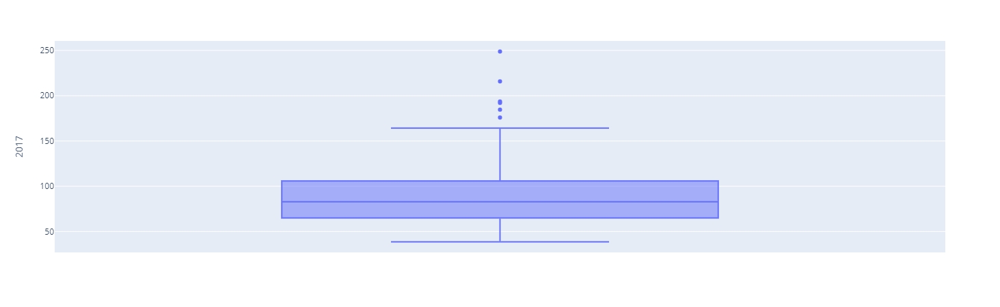

In [58]:
# make a box plot to show the distribution of RFD indicator for 2017 data.
fig = px.box(RFD, y=2017)
fig.show()

With this graph we can see that the 75% of neighbourhoods have incomes under the average. 

In [59]:
#Show the neighbourhood with highest incomes. 
RFD.sort_values(2017,ascending=False).head(5) 

,NºBorough,Borough,Nº Neighbourhood,Neighbourhood,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
20,4,Les Corts,21,Pedralbes,193.6,194.7,198.3,208.4,246.0,240.7,243.9,251.7,250.5,242.4,248.8
23,5,Sarrià-Sant Gervasi,24,Las Tres Torres,215.3,214.7,222.6,225.8,216.4,215.0,224.0,217.8,214.1,211.0,215.8
22,5,Sarrià-Sant Gervasi,23,Sarrià,174.9,172.4,176.1,177.8,180.7,189.8,196.1,195.2,199.1,186.6,193.6
25,5,Sarrià-Sant Gervasi,26,Sant Gervasi-Galvany,187.0,187.1,195.1,201.1,177.7,176.0,195.6,192.1,205.1,198.3,192.1
24,5,Sarrià-Sant Gervasi,25,Sant Gervasi-Bonanova,182.2,177.5,184.5,189.5,190.7,187.9,189.6,191.8,188.9,187.5,184.6


With these data and the previous point it can be seen how **the neighborhoods with higher incomes have lower unemployment rates**. It may be interesting to analyze the relationship between unemployment and income

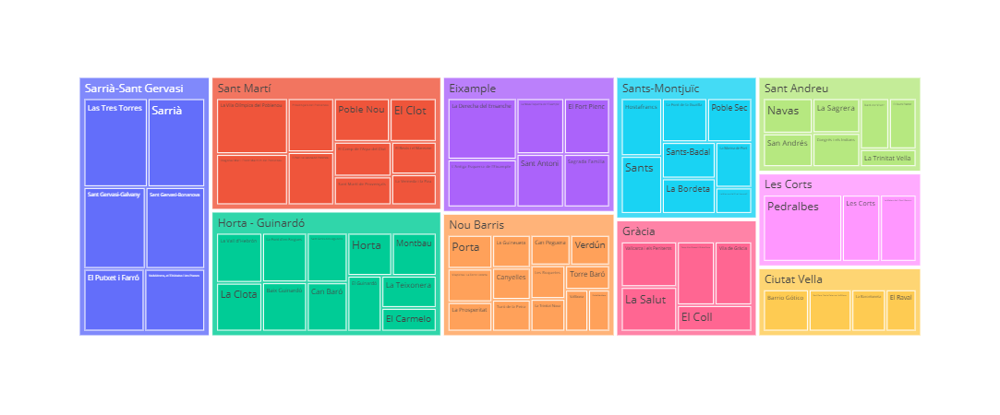

In [60]:
fig = px.treemap(RFD, path=['Borough', 'Neighbourhood'], values=2017)
fig.show()

In [40]:
bcn_data_rfd = pd.read_csv("bcn_data.csv")
bcn_data_rfd.drop(['NºBorough', 'Borough','NºNeighbourhood'], axis = 1, inplace = True)
RFD_coor = RFD.join(bcn_data_rfd.set_index('Neighbourhood'), on='Neighbourhood', how='inner')
RFD_coor.head(5)

,NºBorough,Borough,Nº Neighbourhood,Neighbourhood,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,latitude,longitude
0,1,Ciutat Vella,1,El Raval,64.7,62.6,62.0,62.0,65.0,65.4,60.3,65.9,75.8,74.6,71.2,41.379518,2.168368
1,1,Ciutat Vella,2,Barrio Gótico,86.5,80.8,94.3,92.3,98.8,99.7,103.6,98.5,108.5,110.5,106.1,41.383395,2.176912
2,1,Ciutat Vella,3,La Barceloneta,66.7,65.9,64.4,72.6,73.1,69.0,82.1,84.5,76.6,84.8,79.6,41.380653,2.189927
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",80.2,81.8,88.8,91.2,86.1,89.3,91.2,92.5,96.4,97.8,99.4,41.388322,2.177411
4,2,Eixample,5,El Fort Pienc,107.9,108.3,109.1,108.5,97.9,98.0,99.0,104.5,104.8,105.0,106.5,41.395925,2.182325


In [41]:
bcn_n_geo = r'barris.geojson' # geojson file


neighbour_map = folium.Map(location=[41.3828939, 2.1774322], zoom_start=11)
neighbour_map.choropleth(
    geo_data=bcn_n_geo,
    data=RFD,
    columns=['Neighbourhood', 2017],
    key_on='feature.properties.NOM',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.4,
    legend_name='Neighbourhood RFD',
    reset = True
)


for latitude, longitude, borough, neighbourhood, RFD in zip(RFD_coor['latitude'], RFD_coor['longitude'], RFD_coor['Borough'], RFD_coor['Neighbourhood'],RFD_coor[2017]):
    label = 'Borough: {},Neihbourhood: {}, RFD: {}'.format(borough, neighbourhood, RFD)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=2,
        popup=label,
        color='blue',
        bins = 11,
        fill=True
        ).add_to(neighbour_map)  
    

# display map
neighbour_map

## 4.3 Analyze the relationship between unemployment rate and the RFD indicator. 

As we have seen in the previous points there is a relationship between the unemployment rate and income, we will analyze if there really is a direct relationship.

In [45]:
#Join the tables of RFD and the neighbourhoods
neig_unem_perc = pd.read_excel("Neighbourhood_unemployment_percentage_2020_2021.xlsx")
bcn_unem_RFD = RFD[["Borough","Neighbourhood",2017]].join(neig_unem_perc[["Neighbourhood","2020-1"]].set_index('Neighbourhood'), on='Neighbourhood', how='inner')
bcn_unem_RFD.head(5)

,Borough,Neighbourhood,2017,2020-1
0,Ciutat Vella,El Raval,71.2,8.4
1,Ciutat Vella,Barrio Gótico,106.1,5.1
2,Ciutat Vella,La Barceloneta,79.6,8.8
3,Ciutat Vella,"Sant Pere, Santa Caterina i la Ribera",99.4,7.7
4,Eixample,El Fort Pienc,106.5,5.2


In [69]:
bcn_unem_RFD.corr() # this function give us the correlation between the variables. 

,2017,2020-1
2017,1.00000,-0.76959
2020-1,-0.76959,1.00000


it can be seen an indirect relationship between both variables

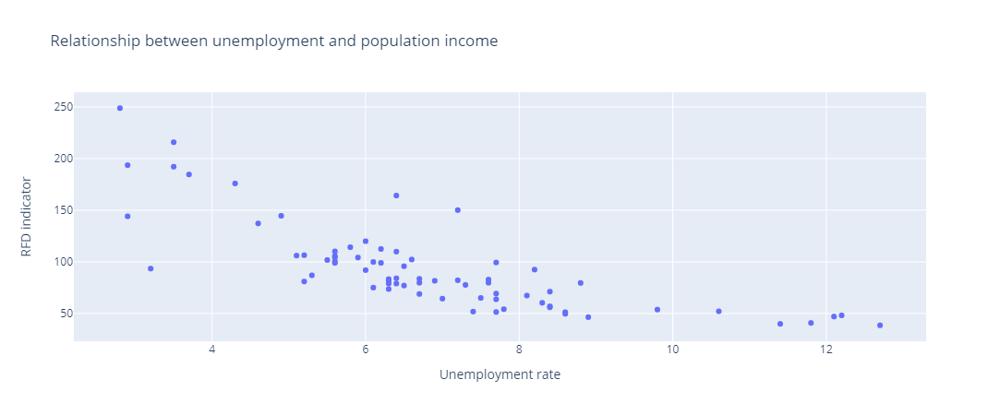

In [48]:
#Make a scatter plot with plotly to visualize the relationship between the unemployment and RFD indicator. 
fig =  px.scatter(x=bcn_unem_RFD["2020-1"], y=bcn_unem_RFD[2017], labels = {"x":"Unemployment rate", "y":"RFD indicator"}
                  , title = "Relationship between unemployment and population income")
fig.show()

We can see how the neighborhoods with high unemployment rates are those with the lowest RFD indicator.

In [71]:
#Find the neighbourhoods with the lowest RFD indicator. 
bcn_unem_RFD.sort_values(by=[2017], inplace = True)
bcn_unem_RFD.head(10)

,Borough,Neighbourhood,2017,2020-1
54,Nou Barris,Ciudad Meridiana,38.6,12.7
11,Sants-Montjuïc,La Marina del Prat Vermell,40.0,11.4
55,Nou Barris,Vallbona,40.9,11.8
53,Nou Barris,Torre Baró,46.5,8.9
56,Sant Andreu,La Trinitat Vella,47.1,12.1
52,Nou Barris,La Trinitat Nova,48.2,12.2
49,Nou Barris,Les Roquetes,49.7,8.6
50,Nou Barris,Verdún,51.3,8.6
46,Nou Barris,Can Peguera,51.5,7.7
45,Nou Barris,Turó de la Peira,51.9,7.4


It can be seen that of the **13 neighborhoods in the Nou Barris district, 8 are among the 10 poorest**.

In [72]:
# find the neighbourhoods with highest RFD indicator. 
bcn_unem_RFD.tail(10)

,Borough,Neighbourhood,2017,2020-1
21,Sarrià-Sant Gervasi,"Vallvidrera, el Tibidabo i les Planes",144.1,2.9
26,Sarrià-Sant Gervasi,El Putxet i Farró,144.6,4.9
68,Sant Martí,Diagonal Mar i Front Marítim del Poblenou,150.1,7.2
66,Sant Martí,La Vila Olímpica del Poblenou,164.2,6.4
6,Eixample,La Derecha del Ensanche,175.9,4.3
24,Sarrià-Sant Gervasi,Sant Gervasi-Bonanova,184.6,3.7
25,Sarrià-Sant Gervasi,Sant Gervasi-Galvany,192.1,3.5
22,Sarrià-Sant Gervasi,Sarrià,193.6,2.9
23,Sarrià-Sant Gervasi,Las Tres Torres,215.8,3.5
20,Les Corts,Pedralbes,248.8,2.8


It can also be seen that **6 of the 6 neighborhoods in the Sarrià-Sant Gervasi district are among the 10 richest**. This determines that the Boroughs can group different lifestyles.

**It can be determined that the district of Nou barris is one of the poorest and that of Sarrià-Sant Gervasi one of the richest**

<h1>5.- Barcelona Bussines data</h1>

The number of businesses and the type of business is decisive for this study. With the information obtained by Foursquare we can see which neighborhoods have green businesses established. Knowing in which they have been successful, we can see neighborhoods with the same characteristics but without established businesses as options to implement our business.

In this section is obtained the data of the bussines of each neighbourhood with the REST API Foursquare

<a href="https://developer.foursquare.com/docs/">Foursquare documentation</a>     



The first problem of Foursquare is the limit of the results with the free version. 

The search is performanced by neighbourhood coordinates with a limit of bussines, and radius of search. Its necessary delete duplicates keeping the business closer to the coordinates of the neighborhood. 
That is, if there are two values and one is 2 meters from the coordinates of the neighborhood and the other business is 5 meters from the registered neighborhood, it is understood that the first value is the correct one, and since the search radius is wide it has been collected for the search of a neighborhood a business from another neighborhood.

**The data necessary for the study are:**
- 5.1.-All Venues from Barcelona

- 5.2.-Venues filtered by key: Ecologic

- 5.3.-Venues filtered by key: Organic
<br></br>
With this data we can classify the neighborhoods according to their businesses and find which ones have the businesses that interest us.
<br></br>

The data obtained contains the following columns:  
- **Neighbourhood:**    Neighbourhood name  
- **Venue Latitude:**   Venue Latitude   
- **Venue Longitude:**  Venue Longitude    
- **Venue:**            The name of the Venue    
- **Venue Category:**   indicates the type of category for the venue 

Import all the necessary modules. 

In [73]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import json # library to handle JSON files
import pandas as pd
import numpy as np   
import matplotlib.pyplot as plt   # show the wordcloud
from PIL import Image # converting images into arrays

In [74]:
#!conda install -c conda-forge wordcloud==1.8.1 --yes
from wordcloud import WordCloud, STOPWORDS  # create wordclouds

Introduce the FOURSQUARE API credentials

In [75]:
CLIENT_ID = 
CLIENT_SECRET =
ACCESS_TOKEN = 
CODE= 

In [77]:
#import the data of neighbourhoods with their coordinates
bcn_coor = pd.read_csv("bcn_data.csv")
bcn_coor.head()

,NºBorough,Borough,NºNeighbourhood,Neighbourhood,latitude,longitude
0,1,Ciutat Vella,1,El Raval,41.379518,2.168368
1,1,Ciutat Vella,2,Barrio Gótico,41.383395,2.176912
2,1,Ciutat Vella,3,La Barceloneta,41.380653,2.189927
3,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",41.388322,2.177411
4,2,Eixample,5,El Fort Pienc,41.395925,2.182325


##### 1. Search for a specific venue category. How to create the URL

> `https://api.foursquare.com/v2/venues/`**search**`?client_id=`**CLIENT_ID**`&client_secret=`**CLIENT_SECRET**`&ll=`**LATITUDE**`,`**LONGITUDE**`&v=`**VERSION**`&query=`**QUERY**`&radius=`**RADIUS**`&limit=`**LIMIT**


Create the functions to return the information and remove the duplicated values. And visualize the information

In [78]:
def getNearbyVenues(names,query, latitudes, longitudes, radius, limite):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&query={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            20180605, 
            query,
            lat, 
            lng, 
            radius,
            limite
            )
        #print(url)  #print the url to see the original response. 
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue and save in list
        venues_list.append([(
            name, 
            v['venue']['location']['lat'],  # Obtain the latitude of the bussines 
            v['venue']['location']['lng'],  # Obtain the longitude of the bussines
            v['venue']['name'],             # Obtain the name of the venue - Bussines
            v['venue']['categories'][0]['name'] # Obtain the Categorie of the venue 
            ) for v in results])
    
    # convert the list into a dataframe 
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    # inster the name of the columns 
    nearby_venues.columns = ['Neighbourhood', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue', 
                  'Venue Category']
    
    return(nearby_venues)

In [79]:
def delete_duplicates(df, neighbourhoods):
    
    cord = df.join(neighbourhoods.set_index('Neighbourhood'), on='Neighbourhood', how='inner')
    cord["lat_dif"] = abs(cord["latitude"] - cord["Venue Latitude"])
    cord["lng_dif"] = abs(cord["longitude"] - cord["Venue Longitude"])
    cord["dif"] = np.sqrt(cord["lat_dif"]**2 + cord["lng_dif"]**2)  #create a column with the distance from the venue coordinates to the neighbourhood coordinates
    for venue,lat,lng in zip(cord['Venue'], cord["Venue Latitude"], cord["Venue Longitude"]): 
        # find the duplicates venues with the name, and coordinates 
        dup = cord.loc[(cord["Venue"]== venue) & (cord["Venue Latitude"] ==lat) & (cord["Venue Longitude"] ==lng)] 
        if len(dup) > 1: # if the name venue and coordinates are duplicated remove the incorrect venues
            max_v = 0
            max_i = 0
            for d in dup["dif"]:# for each venue name obtain the minimun distance for the neighbourhood and remove the other positions
                if max_v < d: # if the distance are less than register actualize the variables
                    if max_v == 0:
                        max_v = d 
                        max_i = cord.index[(cord["dif"]==d) & ((cord["Venue"]== venue) & (cord["Venue Latitude"] ==lat) & (cord["Venue Longitude"] ==lng))].tolist()[0]
                    else:
                        cord.drop(max_i, inplace = True)
                        max_v = d
                        max_i = cord.index[(cord["dif"]==d) & ((cord["Venue"]== venue) & (cord["Venue Latitude"] ==lat) & (cord["Venue Longitude"] ==lng))].tolist()[0]
                else: # if the distance are grater remove the position
                    i = cord.index[(cord["dif"]==d) & ((cord["Venue"]== venue) & (cord["Venue Latitude"] ==lat) & (cord["Venue Longitude"] ==lng))].tolist()[0]
                    cord.drop(i, inplace = True)
                    
                
    df_correct = cord[["Neighbourhood","Venue Latitude","Venue Longitude","Venue","Venue Category"]] #create a new dataframe with the correct venues
    return(df_correct) # return the dataframe without the duplicated venues

In [80]:
def wordcloud(df): # create a Wordcloud with the categorie of the venues
    #the categories are entered in a text format to process the wordcloud
    text = " "
    for venue in  df['Venue Category']:
        text += str(' ')
        text += str(venue).replace(" ","")
        
    bcn_mask = np.array(Image.open('bcn_map2.png'))

    stopwords = set(STOPWORDS)
    # create a wordcloud
    barcelona_wc = WordCloud(
         background_color='white',
         max_words=2000,
         mask = bcn_mask,
         stopwords = stopwords
         )
   
    # generate the word cloud
    barcelona_wc.generate(text)
    
    
    # show the image of the wordcloud
    fig = plt.figure()
    fig.set_figwidth(15) # set width
    fig.set_figheight(15) # set height
    plt.imshow(barcelona_wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

<h2>5.1- Bussiness in barcelona </h2>


In [83]:
bcn_bussines = getNearbyVenues(bcn_coor["Neighbourhood"],"", bcn_coor["latitude"], bcn_coor["longitude"],500, 200)

In [84]:
bcn_bussines.shape # show the number of rows 

(3106, 5)

In [85]:
#obtain the number of diferent categories. 
bcn_bussines.groupby('Venue Category').max().shape

(290, 4)

The data obtain from Foursquare have 290 different categories. 

In [96]:
#obtain the number of venues for each neighbourhood. 
bcn_bussines['Neighbourhood'].value_counts().head(10)

Barrio Gótico                            100
La Vila Olímpica del Poblenou            100
Poble Nou                                100
El Raval                                 100
Vila de Gràcia                           100
L'Antiga Esquerra de l'Eixample          100
Sant Pere, Santa Caterina i la Ribera    100
La Barceloneta                           100
El Parc i la Llacuna del Poblenou         99
Sant Antoni                               93
Name: Neighbourhood, dtype: int64

The results are limited to 100 results by neighbourhood.This limitation comes from the free version

In [87]:
bcn_bussines[["Venue Latitude","Venue Longitude"]].duplicated().value_counts()

False    2753
True      353
dtype: int64

365 venues are duplicated. 

In [88]:
bcn_bussines_clean = delete_duplicates(bcn_bussines, bcn_coor) # Remove the duplicate venues
print("Duplicated data removed")

Duplicated data removed


In [89]:
bcn_bussines_clean.shape # show the data after remove the extra rows. 

(2753, 5)

In [90]:
bcn_bussines_clean.head()

,Neighbourhood,Venue Latitude,Venue Longitude,Venue,Venue Category
1,El Raval,41.379500,2.170463,La Robadora,Gastropub
2,El Raval,41.380096,2.169054,A Tu Bola,Tapas Restaurant
6,El Raval,41.381059,2.167399,33/45,Cocktail Bar
8,El Raval,41.380939,2.167959,Teddys - Libanés,Fast Food Restaurant
9,El Raval,41.380124,2.169198,Ølgod,Beer Bar


The data is the same that not duplicate values. The Duplicate values are cleaning correctly. 

In [91]:
#Once the data is to our liking, we export it.
bcn_bussines_clean.to_csv("bcn_bussines.csv", index = False)

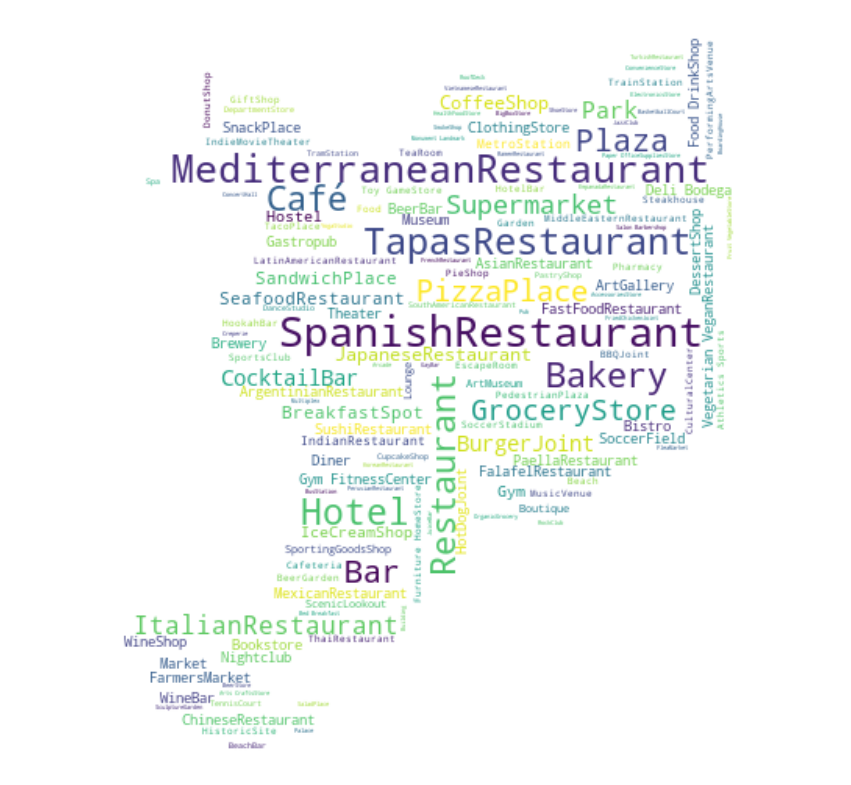

In [92]:
#Make a Wordcloud for the categories type. 
wordcloud(bcn_bussines_clean)

In [93]:
# Obtain the most comon places in Barcelona
venue_frecuency = bcn_bussines_clean['Venue Category'].value_counts()
venue_frecuency.head(12)

Spanish Restaurant          138
Mediterranean Restaurant    128
Tapas Restaurant            121
Hotel                       108
Bakery                      102
Café                        102
Restaurant                  102
Plaza                        80
Bar                          79
Pizza Place                  74
Grocery Store                67
Supermarket                  65
Name: Venue Category, dtype: int64

It can be seen that the restaurants and food places are are the most frequent

<h2>5.2- Ecological Bussines in barcelona</h2>


In [94]:
#Obtain the data of the venues searching for ecologic. 
bcn_bussines_eco = getNearbyVenues(bcn_coor["Neighbourhood"],"ecologic", bcn_coor["latitude"], bcn_coor["longitude"], 750, 30)

In [97]:
#Obtain the number of venues obtained
bcn_bussines_eco.shape

(23, 5)

In [98]:
#Show the duplicated data 
bcn_bussines_eco[["Venue Latitude","Venue Longitude"]].duplicated().value_counts()

False    14
True      9
dtype: int64

In [99]:
#Remove the duplicated data 
bcn_bussines_eco_clean = delete_duplicates(bcn_bussines_eco, bcn_coor)

In [100]:
#show the number of rows after remove duplicates
bcn_bussines_eco_clean.shape

(14, 5)

Now the data is cleaned withouth duplicates

In [101]:
bcn_bussines_eco_clean.head()

,Neighbourhood,Venue Latitude,Venue Longitude,Venue,Venue Category
1,"Sant Pere, Santa Caterina i la Ribera",41.384776,2.179836,Can Cisa / Bar Brutal,Wine Bar
2,El Fort Pienc,41.393724,2.178577,Frooty Supermercado Ecológico,Farmers Market
3,La Derecha del Ensanche,41.394331,2.169537,El Racó Ecològic,Vegetarian / Vegan Restaurant
4,La Derecha del Ensanche,41.394582,2.169693,Racó Ecologic,Vegetarian / Vegan Restaurant
5,L'Antiga Esquerra de l'Eixample,41.393874,2.154287,BON,Salad Place


In [102]:
# Export the obtained data 
bcn_bussines_eco_clean.to_csv("bcn_bussines_eco.csv", index = False)

In [103]:
# Show the number of venues for each neighbourhood. 
bcn_bussines_eco_clean['Neighbourhood'].value_counts()

Vila de Gràcia                           2
La Derecha del Ensanche                  2
L'Antiga Esquerra de l'Eixample          2
La Maternitat i Sant Ramon               1
Sant Gervasi-Galvany                     1
Horta                                    1
Sants-Badal                              1
Sant Pere, Santa Caterina i la Ribera    1
Can Baró                                 1
El Fort Pienc                            1
San Andrés                               1
Name: Neighbourhood, dtype: int64

<h2>5.3- Organic Bussines in barcelona</h2>

In [107]:
# Obtain the data of the venues searching for organic
bcn_bussines_org = getNearbyVenues(bcn_coor["Neighbourhood"],"Organic", bcn_coor["latitude"], bcn_coor["longitude"], 750, 30)

In [108]:
#show the number of rows obtained
bcn_bussines_org.shape

(96, 5)

In [109]:
#Show the number of duplicated rows
bcn_bussines_org[["Venue Latitude","Venue Longitude"]].duplicated().value_counts()

False    55
True     41
dtype: int64

In [110]:
#Remove the duplicates
bcn_bussines_org_clean = delete_duplicates(bcn_bussines_org, bcn_coor)

In [111]:
#Show the data after remove the duplicates
bcn_bussines_org_clean.shape

(55, 5)

In [112]:
bcn_bussines_org_clean.head()

,Neighbourhood,Venue Latitude,Venue Longitude,Venue,Venue Category
1,El Raval,41.378167,2.161389,Casa Ametller,Health Food Store
3,El Raval,41.380699,2.174974,Herbolari del Rei,Health Food Store
4,El Raval,41.376885,2.163108,Federal Café,Café
6,El Raval,41.385096,2.165514,Flax & Kale,Vegetarian / Vegan Restaurant
11,Barrio Gótico,41.382749,2.168745,Veritas,Organic Grocery


In [113]:
#Export the data 
bcn_bussines_org_clean.to_csv("bcn_bussines_org.csv", index = False)

In [114]:
#Show the number of venues for each neighbourhood. 
bcn_bussines_org_clean['Neighbourhood'].value_counts()

Barrio Gótico                            10
L'Antiga Esquerra de l'Eixample           6
La Derecha del Ensanche                   5
Vila de Gràcia                            5
El Raval                                  4
Camp d'en Grassot i Gràcia Nova           3
Sant Pere, Santa Caterina i la Ribera     3
Poble Nou                                 3
Sant Antoni                               3
Las Tres Torres                           2
Sagrada Familia                           2
La Font de la Guatlla                     2
La Barceloneta                            1
Baix Guinardó                             1
La Salut                                  1
San Andrés                                1
Provençals del Poblenou                   1
La Clota                                  1
La Nova Esquerra de l'Eixample            1
Name: Neighbourhood, dtype: int64

#### 5.4 Automatic extraction

Introduce the query of the search to obtain a personal bussines category

In [115]:
#Enter the desired search concept to get the related businesses.
Query = "Ecologic Market"

In [117]:
bcn_coor = pd.read_csv("bcn_data.csv") #import the coordinates data 


#def getNearbyVenues(names,query, latitudes, longitudes, radius, limite):
bcn_bussines_query = getNearbyVenues(bcn_coor["Neighbourhood"],Query, bcn_coor["latitude"], bcn_coor["longitude"], 750, 200)

#remove the duplicates 
bcn_bussines_query2 = delete_duplicates(bcn_bussines_query, bcn_coor)
print("Nº of bussines: ", bcn_bussines_query2.shape) # show the number of rows after remove duplicates

#Export the query data
name = "bcn_bussines_" + Query + ".csv"
bcn_bussines_query2.to_csv(name, index = False)
bcn_bussines_query2.head()

Nº of bussines:  (37, 5)


,Neighbourhood,Venue Latitude,Venue Longitude,Venue,Venue Category
1,El Raval,41.379136,2.160531,Market Hotel,Hotel
2,El Raval,41.379332,2.160694,Market Restaurant,Restaurant
3,El Raval,41.375482,2.174080,Flea Market Barcelona,Flea Market
4,El Raval,41.381370,2.173010,Pasta Market,Italian Restaurant
6,Barrio Gótico,41.383822,2.170553,Carrefour Market,Supermarket


# ---------------------------------------------------------------
# Documentation of the modules used in this notebook
<a href="https://www.crummy.com/software/BeautifulSoup/bs4/doc/">BeautifulSoup documentation</a>    
<a href="https://pandas.pydata.org/docs/">pandas documentation</a>   
<a href="https://plotly.com/python/">plotly documentation</a>   
<a href="https://developer.foursquare.com/docs/">Foursquare documentation</a>    
<a href="https://geopy.readthedocs.io/en/stable/">geopy documentation</a>    
<a href="https://python-visualization.github.io/folium/">Folium documentation</a>    
# ---------------------------------------------------------------


**Thanks for read this notebook :) . The use of this notebook is completely free while it is used for educational purposes.**